In [1]:
using DrWatson
@quickactivate "momdist"

In [2]:
using Ripserer, PersistenceDiagrams, PersistenceDiagramsBase
using Random, Distributions, Parameters, Pipe, ProgressMeter, Plots, StatsPlots, JLD2
using Distances, LinearAlgebra, Statistics, LazySets, Roots, LambertW, LaTeXStrings

In [3]:
import RobustTDA as rtda

###  Sample Points

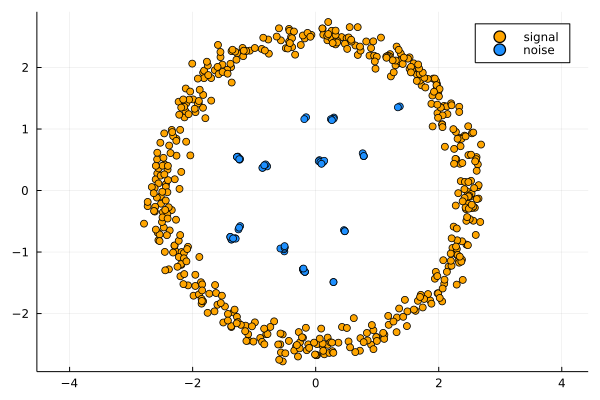

In [4]:
Random.seed!(2022)
n = 500
m = rand([50:1:150]..., 1)[1]

l = 1.5
win = (-l, l, -l, l)
noise = rtda.randMClust(m..., window=win, λ1=2, λ2=10, r=0.05)
signal = 2.5 .* rtda.randCircle(n, sigma=0.05)

X = [signal; noise]
Xn_signal = rtda._ArrayOfTuples_to_ArrayOfVectors(signal)
Xn = rtda._ArrayOfTuples_to_ArrayOfVectors(X)

scatter(signal, c=:orange, ratio=1, label="signal")
scatter!(noise, c=:dodgerblue, label="noise")

###  MoM Dist Function

In [5]:
Random.seed!(2022)
Q = 2 * m + 1
dnq = rtda.momdist(Xn, floor(Int, Q))
w_momdist = rtda.fit(Xn, dnq);

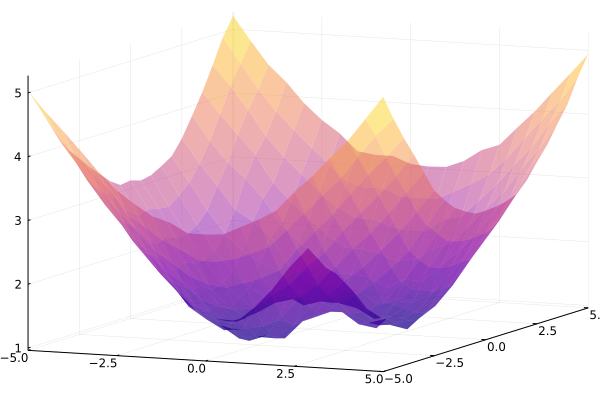

In [6]:
plt = rtda.surfacePlot(-5:0.5:5, f=(x, y) -> rtda.fit([[x, y]], dnq), c=:plasma, alpha=0.5, colorbar=false);

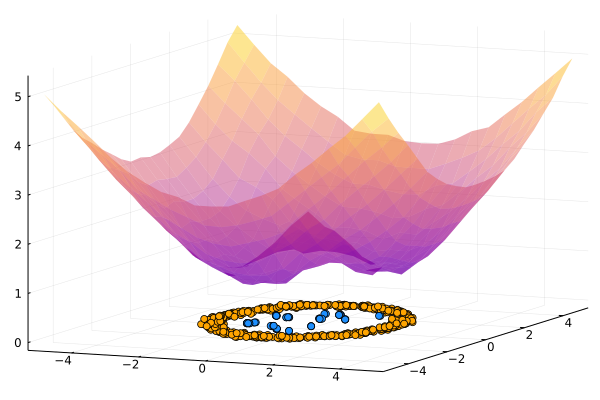

In [7]:
signal_z = [tuple([x..., 0]...) for x in signal];
noise_z = [tuple([x..., 0]...) for x in noise];
plt = scatter(plt, signal_z, label=nothing, c=:orange);
plt = scatter(plt, noise_z, label=false, c=:dodgerblue, legend=false)

###  MoM Dist weighted offsets

In [8]:
offset = (plt, i) -> plot(plt, rtda.Balls(Xn, rtda.rfx.(levels[i], w_momdist, 1)), c=cols[i], linealpha=0, ratio=1, fillalpha=0.1)

cols = colormap("Blues", 5)
levels = [1.5, 1.75, 2.0, 2.25, 2.5]

plt = scatter(X, marker_z=w_momdist, label=nothing, c=:plasma, markeralpha=1, markersize=3, colorbar=true)
plt = offset(plt, 5)
plt = offset(plt, 4)
plt = offset(plt, 3)
plt = offset(plt, 2)
plt = offset(plt, 1)
scatter!(X, marker_z=w_momdist, label=nothing)

┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /storage/home/s/suv87/work/julia_depot/packages/Plots/1KWPG/src/backends/gr.jl:513


###  MoM Dist Sublevel Persistence Diagram using Cubical Homology

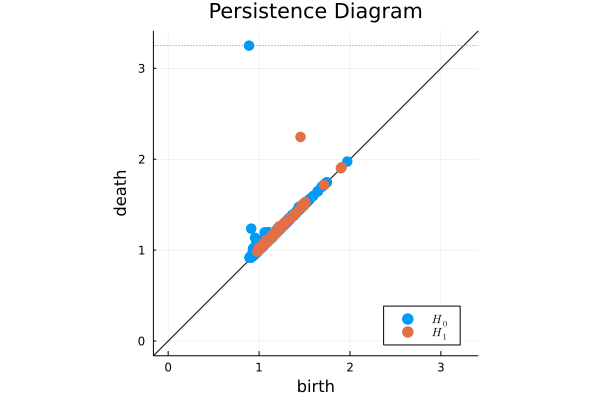

In [9]:
xseq = -3.5:0.05:3.5 # Grid for Cubical complex
G = [rtda.fit([[x, y]], dnq) for x in xseq, y in xseq]
PH_sublevel = G |> Cubical |> ripserer
D_sublevel = @pipe PH_sublevel |> plot(_, label=[L"H_0" L"H_1"], markersize=6, markeralpha=1)

###  MoM Dist Weighted-Rips Persistence Diagram

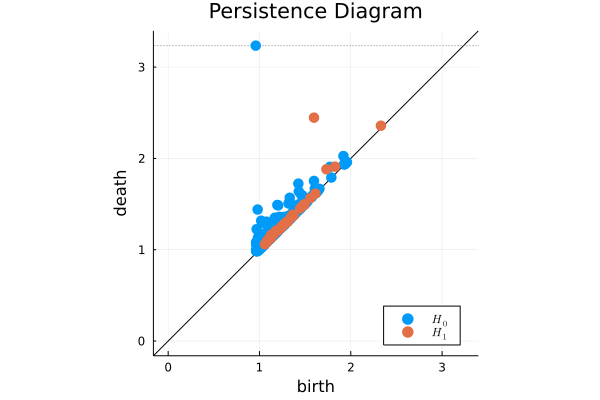

In [10]:
PH_wrips = rtda.wrips(Xn, w=w_momdist, p=1)
D_wrips = @pipe PH_wrips |> plot(_, label=[L"H_0" L"H_1"], markersize=6, markeralpha=1)

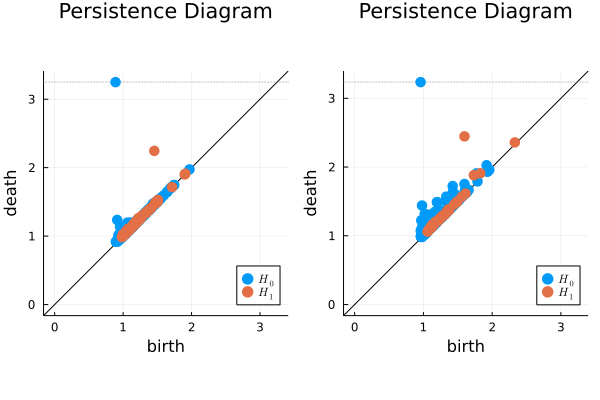

In [11]:
plot(D_sublevel, D_wrips)